<a href="https://colab.research.google.com/github/CienciaDatosUdea/002_EstudiantesAprendizajeEstadistico/blob/main/semestre2025-2/Laboratorios/Laboratorio_07_nn_zeroV1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


In [ ]:
import pandas as pd
import scipy as sc
import numpy as np
import h5py
import matplotlib.pylab as plt
from tqdm import tqdm

In [ ]:
!wget https://github.com/CienciaDatosUdea/002_EstudiantesAprendizajeEstadistico/raw/f170fa0980192f9fe2ee5f2d7bd7962b4d66d517/semestre2025-2/Laboratorios/dataset/train_catvnoncat.h5
!wget https://github.com/CienciaDatosUdea/002_EstudiantesAprendizajeEstadistico/raw/f170fa0980192f9fe2ee5f2d7bd7962b4d66d517/semestre2025-2/Laboratorios/dataset/test_catvnoncat.h5

--2025-11-25 15:29:34--  https://github.com/CienciaDatosUdea/002_EstudiantesAprendizajeEstadistico/raw/f170fa0980192f9fe2ee5f2d7bd7962b4d66d517/semestre2025-2/Laboratorios/dataset/train_catvnoncat.h5
Resolving github.com (github.com)... 140.82.113.3
Connecting to github.com (github.com)|140.82.113.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/CienciaDatosUdea/002_EstudiantesAprendizajeEstadistico/f170fa0980192f9fe2ee5f2d7bd7962b4d66d517/semestre2025-2/Laboratorios/dataset/train_catvnoncat.h5 [following]
--2025-11-25 15:29:34--  https://raw.githubusercontent.com/CienciaDatosUdea/002_EstudiantesAprendizajeEstadistico/f170fa0980192f9fe2ee5f2d7bd7962b4d66d517/semestre2025-2/Laboratorios/dataset/train_catvnoncat.h5
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.108.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443.

In [ ]:
data_train= "train_catvnoncat.h5"
train_dataset = h5py.File(data_train, "r")

data_test= "test_catvnoncat.h5"
test_dataset = h5py.File(data_test, "r")

In [ ]:
train_dataset.keys()

<KeysViewHDF5 ['list_classes', 'train_set_x', 'train_set_y']>

In [ ]:
train_dataset['train_set_x']

<HDF5 dataset "train_set_x": shape (209, 64, 64, 3), type "|u1">

In [ ]:
# Read the data
xtrain_classes, xtrain, train_label =\
train_dataset["list_classes"],train_dataset["train_set_x"],train_dataset["train_set_y"]

test_classes, xtest,test_label =\
test_dataset["list_classes"],test_dataset["test_set_x"],test_dataset["test_set_y"]


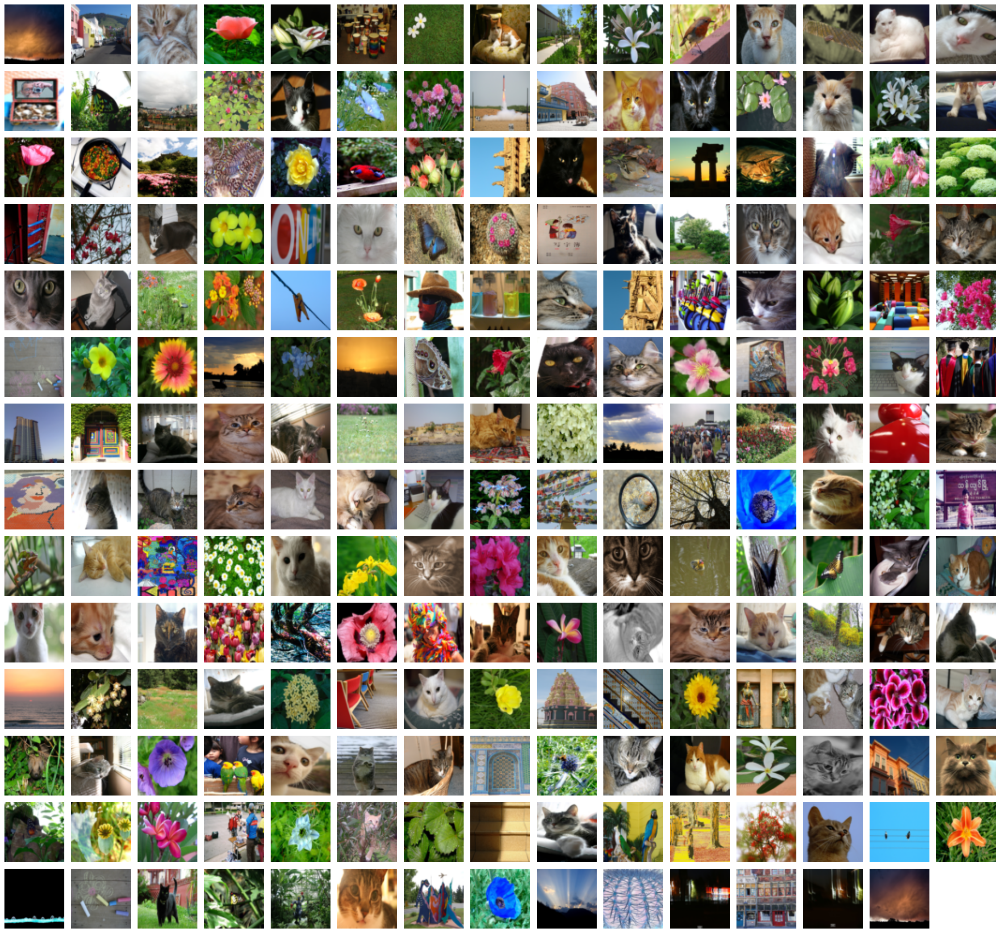

In [ ]:
num_images = len(xtrain)
cols = 15  # You can adjust the number of columns
rows = (num_images + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(cols * 1.5, rows * 1.5))
axes = axes.flatten()

for i in range(num_images):
    axes[i].imshow(xtrain[i])
    axes[i].axis('off')

# Hide any unused subplots
for j in range(num_images, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

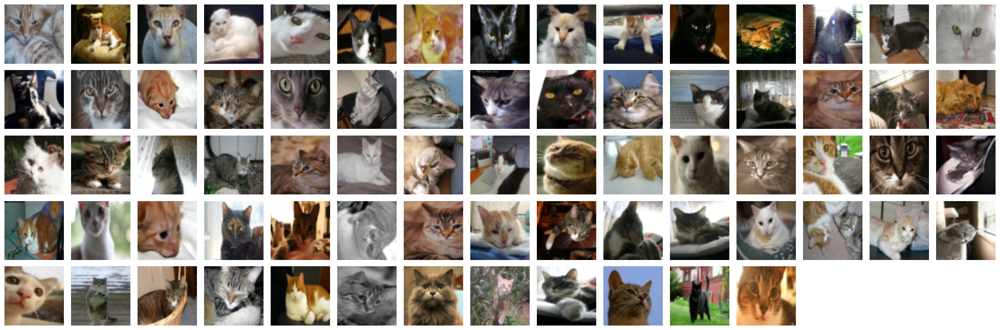

In [ ]:
sologatos = xtrain[np.where(np.array(train_label) == 1)[0]]
num_images = len(sologatos)
cols = 15  # You can adjust the number of columns
rows = (num_images + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(cols * 1.5, rows * 1.5))
axes = axes.flatten()

for i in range(num_images):
    axes[i].imshow(sologatos[i])
    axes[i].axis('off')

# Hide any unused subplots
for j in range(num_images, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

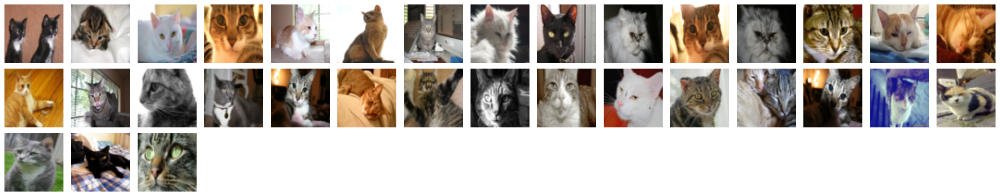

In [ ]:
sologatos_test = xtest[np.where(np.array(test_label) == 1)[0]]
num_images = len(sologatos_test)
cols = 15  # You can adjust the number of columns
rows = (num_images + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(cols * 1.5, rows * 1.5))
axes = axes.flatten()

for i in range(num_images):
    axes[i].imshow(sologatos_test[i])
    axes[i].axis('off')

# Hide any unused subplots
for j in range(num_images, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

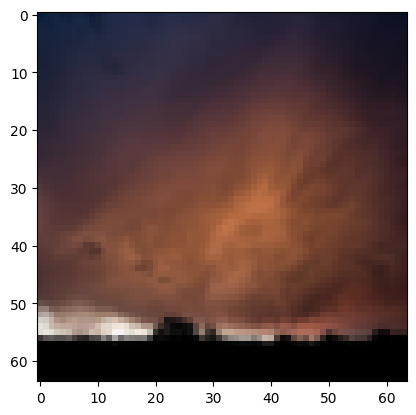

In [ ]:
plt.imshow(xtrain[208])

Construyamos una red neuronal con una capa de entrada, una capa de salida con una red y L-1 redes ocultas.

# Con m datos de entrenamientos.

Para $m$ datos de entrenamiento, las expresión anteriores pueden ser resumidas en las siguientes ecuaciones



\begin{equation}
\begin{bmatrix}
z_1^{(0)}  &z_1^{(1)} & .&.& .&z_1^{(m)}\\
z_2^{(0)}  &z_2^{(1)} &. &.&  .&z_2^{(m)}\\
.          & .        &. & &   &.      \\
.          & .        &  &. &   &.      \\
.          & .        &  &  & .&      \\
z_{n^{[l]}}^{(0)}&z_{n^{[l]}}^{(1)} & . & .& .& z_{n^{[l]}}^{(m)}        \\
\end{bmatrix}^{[l]}=
\begin{bmatrix}
\theta_{11} & \theta_{12} & . & .& .& \theta_{1n^{[l-1]}}\\
\theta_{21} & \theta_{22} & . & .& .& \theta_{2n^{[l-1]}}\\
. & .  & . &   & & .\\
. & .  &   & . & & .\\
. & .  &   &  & .& .\\
\theta_{n^{[l]}1} & \theta_{n^{[l]}2} & . & .& .& \theta_{n^{[l]}n^{[l-1]}}\\
\end{bmatrix}^{[l]}_{n^{[l]} \times n^{[l-1]}}
\begin{bmatrix}
a_1^{(0)}  &a_1^{(1)} & .&.& .&a_1^{(m)}\\
a_2^{(0)}  &a_2^{(1)} &. &.&  .&a_2^{(m)}\\
.          & .        &. & &   &.      \\
.          & .        &  &. &   &.      \\
.          & .        &  &  & .&      \\
a_{n^{[L-1]}}^{(0)}&a_{n^{[L-1]}}^{(1)} & . & .& .& a_{n^{[L-1]}}^{(m)}        \\
\end{bmatrix}^{[l-1]} +
\begin{bmatrix}
b_1 \\
b_2 \\
. \\
. \\
. \\
b_{n^{[l]}}\\
\end{bmatrix}^{[l]}
\end{equation}


Escrito de una formas mas compacta tenemos que:


\begin{equation}
[ \vec{Z}^{[l](0)},\vec{Z}^{[l](1)},...,\vec{Z}^{[l](m)}  ]= \Theta^{[l]} [\vec{A}^{[l-1](0)},\vec{A}^{[l-1](1)},...,\vec{A}^{[l-1](m)} ]+ \vec{b}^{[l]}
\end{equation}

Aplicando la funcion de activación:

\begin{equation}
[\vec{A}^{[l](0)},\vec{A}^{[l](1)},...,\vec{A}^{[l](m)} ]=f([\vec{Z}^{[l](0)},\vec{Z}^{[l](1)},...,\vec{Z}^{[l](m)}  ])
\end{equation}

Las dimensiones de las expresiones anteriores, pueden ser resumidas en lo siguiente:

$\mathrm{dim(\vec{\cal{Z}}^{[l]})}=n^{[l]}\times m $

$\mathrm{dim(\vec{\Theta}^{[l]})}=n^{[l]}\times n^{[l-1]}$

$\mathrm{dim(\vec{\cal{A}}^{[l]})}=n^{[l-1]}\times m $

$\mathrm{dim(\vec{b}^{[l]})}=n^{[l]}$




## Topología de la red.

1. Construir un clase  que permita definir una red neuronal con la topología
deseada y la función de activación para cada capa, para ello deberá construir una funcion Topology con el número de capas de la red neuronal :

Topology = [n_x, n_h1, n_h2, n_h3, ...,n_y]

En este caso:
- $n^{[0]}=n_x$ seran los valores de entradas de la capa de entrada
- $n^{[1]}=n_{h1}$ Primera capa oculta de la red neuronal
- $n^{[2]}=n_{h2}$ Segunda capa oculta de la red neuronal

.

.

.


- $n^{[l]}=n_{hl}$ Segunda capa oculta de la red neuronal
.

.

.

- $n^{[L]}=n_{y}$ Segunda capa oculta de la red neuronal

donde

- $\mathrm{n_x}$: valores de entrada
- $\mathrm{n_{h1}}$: hidden layer 1
- $\mathrm{n_{h2}}$: hidden layer 2
- $\mathrm{n_y}$: last layer

- $n^{[L]}=n_{y}$ Segunda capa oculta de la red neuronal


También definir una lista con las funciones de activaciones para cada capa.


activation=[None, relu, relu, relu, ...,sigmoid]

  


a. Cada unas de las capas deberá tener los parámetros de inicialización de manera aleatoria:


La matriz de parametros para cada capa debera tener:


$\mathrm{dim(\vec{b}^{[l]})}=n^{[l]}$

$\mathrm{dim(\vec{\Theta}^{[l]})}=n^{[l]}\times n^{[l-1]}$

Lo anteriores parametros deberán estar en el constructor de la clase.


b. Construya un metodo llamado output cuya salida serán los valores de Z y A


$\mathrm{dim(\vec{\cal{A}}^{[l]})}=n^{[l-1]}\times m $

$\mathrm{dim(\vec{\cal{Z}}^{[l]})}=n^{[l]}\times m $.

In [ ]:
import numpy as np
class layer_nn():
    def __init__(self, act_fun, nlayer_presente, nlayer_before):
        self.theta = 2*np.random.random((nlayer_presente, nlayer_before))-1
        self.B = 2*np.random.random((nlayer_presente, 1))-1
        self.act_fun = act_fun


In [ ]:
def act_funcion(x, activation):
    if activation=="sigmoid":
        f=lambda x: 1/(1+np.exp(-x))
        fp=f(x)*(1-f(x))
        return np.array([f, fp])


In [ ]:
layer = layer_nn("sigmoid", 3, 3)

In [ ]:
topology = [12288, 3, 4, 6, 1]
l1 = layer_nn("sigmoid", 3, 10)
l2 = layer_nn("sigmoid", 4, 3)
l3 = layer_nn("sigmoid", 6, 4)
l4 = layer_nn("sigmoid", 1, 6)




Se sugiere para cada capa emplear programación orientada a objetos definida de la siguiente manera:

```
class layer_nn():
  def __init__(self, act_fun, nlayer_present, nlayer_before):
    self.theta = 2*np.random.random((nlayer_present, nlayer_before)) - 1
    self.B = 2*np.random.random((nlayer_present,1)) - 1
    self.act_fun = act_fun

  def output(self, Z, A):
    self.Z = Z
    self.A = A



def act_function(x, activation):
  if activation=="sigmoid":
    f = lambda x: 1/(1+np.exp(-x))
    fp = f(x)*(1-f(x))
    return f, fp
  
  elif activation == "tanh":
    f = lambda x: np.tanh
    return tanh
  else :
    return 0
```
    

2. Construir un generalizacion de la red, en el que entrada el valor inicial
y la red neuronal completa arroje la salida y la actualizacion de la red con los parametros deseados:

  ```
  A, nn = forward_pass(A0, nn_red)

 ```
3. Encontrar la funcion de coste.


$$-\frac{1}{m} \sum\limits_{i = 1}^{m} (y^{(i)}\log\left(a^{[L] (i)}\right) + (1-y^{(i)})\log\left(1- a^{[L](i)}\right)) \tag{7}$$


4. Construir un codigo que permita realizar el BackwardPropagation


# Backward Propagation

Para una capa $l$ arbitraria tenemos que:

- \begin{equation}
d\Theta^{[l]} =  d{\cal Z}^{(i)[l]} Trans(A)^{(i)[l-1]} = dA^{(i)[l]} f'({\cal Z}^{(i)[l]} ) Trans(A)^{(i)[l-1]}
\end{equation}

- \begin{equation}
db^{[l]} =  d{\cal Z}^{(i)[L]}  = dA^{(i)[l]} f'({\cal Z}^{(i)[l]} )
\end{equation}
```
db_L =  m_*np.sum(dZ, axis=1, keepdims=True)
```
Los valores de dA pueden ser escritos como:
- \begin{equation}
dA^{(i)[l-1]} = \Theta^{l} \cdot dZ^{(i)[l]}
\end{equation}





$ dZ^{[l]} = dA^{[l]} * f'^{[l]} (Z^{[l]}) $
$ d\Theta^{[l]} = \frac{\partial \mathcal{J} }{\partial \Theta^{[l]}} = \frac{1}{m} dZ^{[l]} A^{[l-1] T} \tag{1}$
$ db^{[l]} = \frac{\partial \mathcal{J} }{\partial b^{[l]}} = \frac{1}{m} \sum_{i = 1}^{m} dZ^{[l](i)}\tag{2}$
$ dA^{[l-1]} = \frac{\partial \mathcal{L} }{\partial A^{[l-1]}} = \theta^{[l] T} dZ^{[l]} \tag{3}$


Para la capa L esima:

```
dAL = -(np.divide(Y, A) - np.divide(1 - Y, 1 - A))
```

# Aplicacion gradiente descendente

$$ \Theta^{[l]} = \Theta^{[l]} - \alpha \text{ } d\Theta^{[l]} \tag{16}$$
$$ b^{[l]} = b^{[l]} - \alpha \text{ } db^{[l]} \tag{17}$$


# Generalizacion Forward Pass


\begin{equation}
[ \vec{Z}^{[l](0)},\vec{Z}^{[l](1)},...,\vec{Z}^{[l](m)}  ]= \Theta^{[l]} [\vec{A}^{[l-1](0)},\vec{A}^{[l-1](1)},...,\vec{A}^{[l-1](m)} ]+ \vec{b}^{[l]}
\end{equation}




# Backward Propagation

Para una capa $l$ arbitraria tenemos que:

- \begin{equation}
d\Theta^{[l]} =  d{\cal Z}^{(i)[l]} Trans(A)^{(i)[l-1]} = dA^{(i)[l]} f'({\cal Z}^{(i)[l]} ) Trans(A)^{(i)[l-1]}
\end{equation}

- \begin{equation}
db^{[l]} =  d{\cal Z}^{(i)[L]}  = dA^{(i)[l]} f'({\cal Z}^{(i)[l]} )
\end{equation}
```
db_L =  m_*np.sum(dZ, axis=1, keepdims=True)
```
Los valores de dA pueden ser escritos como:
\begin{equation}
dA^{(i)[l-1]} = \Theta^{l} \cdot dZ^{(i)[l]}
\end{equation}


$ dZ^{[l]} = dA^{[l]} * f'^{[l]} (Z^{[l]}) \tag{0}$
$ d\Theta^{[l]} = \frac{\partial \mathcal{J} }{\partial \Theta^{[l]}} = \frac{1}{m} dZ^{[l]} A^{[l-1] T} \tag{1}$
$ db^{[l]} = \frac{\partial \mathcal{J} }{\partial b^{[l]}} = \frac{1}{m} \sum_{i = 1}^{m} dZ^{[l](i)}\tag{2}$
$ dA^{[l-1]} = \frac{\partial \mathcal{L} }{\partial A^{[l-1]}} = \theta^{[l] T} dZ^{[l]} \tag{3}$


Para la capa L esima:

```
dAL = -(np.divide(Y, A) - np.divide(1 - Y, 1 - A))
```

# Desarrollo

### Aplicación forward

1. Construir un clase  que permita definir una red neuronal con la topología
deseada y la función de activación para cada capa, para ello deberá construir una funcion Topology con el número de capas de la red neuronal

In [ ]:
def activation_function(z,nombre_func_activacion):

  in_ , m = z.shape # --> super importante (in x m)

  if nombre_func_activacion == "sigmoid":
    f= 1/(1+np.exp(-z))
    fp=f*(1-f)
    return f, fp

  elif nombre_func_activacion == "tanh":
    f = np.tanh(z)
    fp = 1 - f**2
    return f , fp

  else:
    print("No se definio función de activación")
    return [np.zeros((in_,m)), np.zeros((in_,m))]

def topology(layers, N_input, N_neurons, N_output = 1):

  """
  layers: numero de capas ocultas (no incluye la entrada) (int)
  N_input: numero de entradas
  N_neurons: numero de neuronas por capa
  N_output: numero de salidas
  """
  topologia = np.ones(layers + 1, dtype=int) * N_neurons
  topologia[0] = N_input
  topologia[-1] = N_output
  return topologia

def topology_2(layers, N_input):
  """
  layers: numero de capas ocultas (no incluye la entrada) (int)
  N_input: numero de entradas
  """
  topologia = [N_input] * (layers+1)
  topologia[1:] = [N_input//(2**n) for n in range(1,layers + 1)]
  topologia[-1] = 1

  return np.array(topologia, dtype=int)

In [ ]:
class nn_layer():

  # m: representa el núm de predicciones
  # en etapas de entrenamiento, representa la cantidad de datos

  def __init__(self,entrada,salida,nombre_func_activacion):

    self.theta = 2*np.random.random((salida,entrada)) - 1 # --> (out,in)
    self.b = 2*np.random.random((salida,1)) - 1           # --> (out,m)
    self.act_function = nombre_func_activacion

  def output_layer(self,A):
    self.z = self.theta@A + self.b # --> (out,m)
    self.A = activation_function(self.z,self.act_function)[0]  # --> (in,m)
    self.Ap = activation_function(self.z,self.act_function)[1] # --> (in,m)

2. Construir un generalizacion de la red, en el que entrada el valor inicial
y la red neuronal completa arroje la salida y la actualizacion de la red con los parametros deseados:

  ```
  A, nn = forward_pass(A0, nn_red)

 ```

In [ ]:
class nn():

  def __init__(self,topologia,activation_functions_list):

    self.topology = topologia
    self.activation_list = activation_functions_list
    self.network = np.empty((len(self.topology)-1) , object)

    for i in range(len(self.topology)-1):

      self.network[i] = nn_layer(
          entrada = self.topology[i],
          salida = self.topology[i+1],
          nombre_func_activacion =  self.activation_list[i]
          )

  def forward_pass(self,X):

    self.A0 = X # Entrada de la red
    self.network[0].output_layer(self.A0)

    for i in range(1,len(self.topology)-1):
      self.network[i].output_layer(self.network[i-1].A)

    self.Af = self.network[-1].A
    self.Apf = self.network[-1].Ap


In [ ]:
topologia = [3,5,3,1] # ejemplo
funcion = ["sigmoid"] * (len(topologia)-1)

NN = nn(topologia,funcion)

In [ ]:
m = 4

X = np.random.random((3,m))
Y = (np.random.random((m,1)) > 0.5) * 1

print(f"shape X: {X.shape}")
print(f"shape Y: {Y.shape}")
print(f"Y.T: {Y.T}")

NN.forward_pass(X)

print(f"output: {NN.network[-1].A}")

shape X: (3, 4)
shape Y: (4, 1)
Y.T: [[0 1 1 1]]
output: [[0.56115824 0.55451269 0.57284445 0.55476111]]


In [ ]:
NN.network[-2].A.T

array([[0.3501409 , 0.43169367, 0.47194168],
       [0.38560688, 0.41496286, 0.42838492],
       [0.32766744, 0.39802446, 0.47289547],
       [0.39116525, 0.40498926, 0.41798888]])

3. Encontrar la funcion de coste.


$$-\frac{1}{m} \sum\limits_{i = 1}^{m} (y^{(i)}\log\left(a^{[L] (i)}\right) + (1-y^{(i)})\log\left(1- a^{[L](i)}\right)) \tag{7}$$

In [ ]:
m = X.shape[1]
J = -1/m * ( np.log(NN.Af)@Y + np.log(1 - NN.Af)@(1-Y) )
print(f"coste: {J}")


coste: [[0.63991018]]


4. Construir un codigo que permita realizar el BackwardPropagation

In [ ]:
# Backward

# L layer
dA_L = -Y.T/NN.Af + (1-Y.T)/(1-NN.Af) ; print(f"dA_L shape: {dA_L.shape}")

dZ_L = dA_L * NN.Apf ; print(f"dZ_L shape: {dZ_L.shape}")
dO_L = 1/m * dZ_L @ NN.network[-2].A.T ; print(f"dO_L shape: {dO_L.shape}")
db_L = 1/m * np.sum(dZ_L, axis=1, keepdims=True) ; print(f"db_L shape: {db_L.shape}")

dA_L shape: (1, 4)
dZ_L shape: (1, 4)
dO_L shape: (1, 3)
db_L shape: (1, 1)


In [ ]:
# L-1 layer

dA = NN.network[-1].theta.T @ dZ_L ; print(f"dA shape: {dA.shape}")

# actualizar variables l aqui --> b = b - a * db

NN.network[-1].theta = NN.network[-1].theta - 1e-3 * dO_L
NN.network[-1].b = NN.network[-1].b - 1e-3 * db_L


# Nuevos gradientes
dZ = dA * NN.network[-2].Ap ; print(f"dZ shape: {dZ.shape}")
dO = 1/m * dZ @ NN.network[-3].A.T ; print(f"dO shape: {dO.shape}")
db = 1/m * np.sum(dZ, axis=1, keepdims=True) ; print(f"db shape: {db.shape}")

dA shape: (3, 4)
dZ shape: (3, 4)
dO shape: (3, 5)
db shape: (3, 1)


In [ ]:
# capa 1:

dA = NN.network[1].theta.T @ dZ ; print(f"dA shape: {dA.shape}")

NN.network[-2].theta = NN.network[-2].theta - 1e-3 * dO
NN.network[-2].b = NN.network[-2].b - 1e-3 * db

dZ = dA * NN.network[0].Ap ; print(f"dZ shape: {dZ.shape}")
dO = 1/m * dZ @ X.T ; print(f"dO shape: {dO.shape}")
db = 1/m * np.sum(dZ, axis=1, keepdims=True) ; print(f"db shape: {db.shape}")

dA shape: (5, 4)
dZ shape: (5, 4)
dO shape: (5, 3)
db shape: (5, 1)


Generalización mediante métodos de la clase NN

In [ ]:
class nn():

  def __init__(self,topologia,activation_functions_list):

    self.topology = topologia
    self.activation_list = activation_functions_list
    self.network = np.empty((len(self.topology)-1) , object)

    for i in range(len(self.topology)-1):

      self.network[i] = nn_layer(
          entrada = self.topology[i],
          salida = self.topology[i+1],
          nombre_func_activacion =  self.activation_list[i]
          )

  def forward_pass(self,X):

    self.A0 = X # Entrada de la red
    self.network[0].output_layer(self.A0)

    for i in range(1,len(self.topology)-1):
      self.network[i].output_layer(self.network[i-1].A)

    self.Af = self.network[-1].A
    self.Apf = self.network[-1].Ap

  def backward_pass(self):

    for i in range(1,len(self.network)+1):

      if i == 1:
        self.network[-i].dA = -self.Y.T/self.network[-i].A + (1-self.Y.T)/(1-self.network[-i].A)

      self.network[-i].dZ = self.network[-i].dA * self.network[-i].Ap
      self.network[-i].db = 1/self.m * np.sum(self.network[-i].dZ, axis=1, keepdims=True)

      # Para la primer capa oculta no debemos de calcular dA^-1 y A^-1 = A0
      if i != len(self.network):
        self.network[-i].dtheta = 1/self.m * self.network[-i].dZ @ self.network[-i-1].A.T
        self.network[-i-1].dA = self.network[-i].theta.T @ self.network[-i].dZ

      else:
        self.network[-i].dtheta = 1/self.m * self.network[-i].dZ @ self.A0.T

      # actualización de los parametros capa

      self.network[-i].theta = self.network[-i].theta - self.learning_rate * self.network[-i].dtheta
      self.network[-i].b = self.network[-i].b - self.learning_rate * self.network[-i].db

  def cost_func(self):
    # Extract scalar value from the 1x1 array result of the dot product
    self.J = (-1/self.m * (np.log(self.Af)@self.Y + np.log(1 - self.Af)@(1 - self.Y))).item()

  def fit(self,X,Y,epoch,learning_rate = 1e-3):

    self.A0 = X
    self.Y = Y
    self.m = X.shape[1]
    self.learning_rate = learning_rate

    self.time_line = np.zeros(epoch)

    for i in tqdm(range(epoch)):

      self.forward_pass(self.A0)
      self.cost_func()
      self.time_line[i] = self.J
      self.backward_pass()

  def prediccion(self,X):
    self.forward_pass(X)
    return self.Af


Comprobación del funcionamiento de la red

In [ ]:
# Data set de imagenes, en este caso no empleamos los canales de color

xtrain_= np.reshape(xtrain,(209, 64*64*3)).T/255
ytrain = np.reshape(train_label, (209,1))

xtest_ = np.reshape(xtest,(50, 64*64*3)).T/255
ytest = np.reshape(test_label,(50,1))

Cat_train = np.reshape(sologatos,(72, 64*64*3)).T/255
Cat_test = np.reshape(sologatos_test,(33, 64*64*3)).T/255

In [ ]:
print(f"y shape: {ytrain.shape}")
print(f"x shape: {xtrain_.shape}")

y shape: (209, 1)
x shape: (12288, 209)


In [ ]:
topologia = topology_2(16,xtrain_.shape[0])
topologia_MLP =  topologia[::4]

activation_list = ["sigmoid"] * (len(topologia_MLP)-1)
print(topologia_MLP)

[12288   768    48     3     1]


In [ ]:
MLP = nn(topologia_MLP,activation_list)
MLP.fit(xtrain_,ytrain,1000,learning_rate=0.1)

100%|██████████| 1000/1000 [06:06<00:00,  2.73it/s]


In [ ]:
MLP.prediccion(Cat_train)

array([[0.92122848, 0.89386921, 0.80281429, 0.92523365, 0.92855478,
        0.92934134, 0.93048385, 0.91958508, 0.91155802, 0.90951326,
        0.92453501, 0.79014631, 0.93466853, 0.92617495, 0.91280464,
        0.87539325, 0.92824244, 0.91525597, 0.92209933, 0.92637657,
        0.92040678, 0.91377276, 0.9300756 , 0.91087546, 0.91234963,
        0.92678071, 0.89608019, 0.91299019, 0.87398791, 0.92245652,
        0.66321654, 0.92482202, 0.91666159, 0.90676682, 0.92590544,
        0.93317526, 0.91218795, 0.92474004, 0.926854  , 0.9214176 ,
        0.92454717, 0.93106963, 0.92504027, 0.9261196 , 0.93540884,
        0.9141546 , 0.92286085, 0.92190319, 0.91921263, 0.92789976,
        0.92558445, 0.91888676, 0.895005  , 0.86527565, 0.91916211,
        0.91486724, 0.89135591, 0.9292051 , 0.9297149 , 0.93301809,
        0.9025802 , 0.85012658, 0.91670467, 0.91824226, 0.42912212,
        0.92211229, 0.91889008, 0.35991573, 0.93399995, 0.92170559,
        0.91545969, 0.93658624]])

Time-line de la función de coste en función de las epocas:

Por alguna razón mi módelo se demora bastante en converger y además creo que se evidencia sobre ajuste

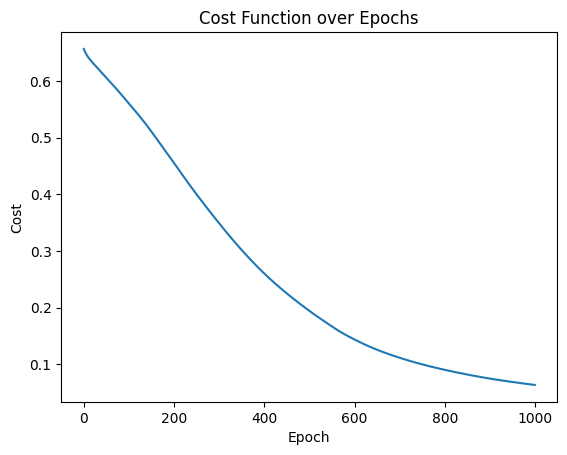

In [ ]:
plt.plot(MLP.time_line)
plt.xlabel('Epoch')
plt.ylabel('Cost')
plt.title('Cost Function over Epochs')
plt.show()

Efectividad del módelo

In [ ]:
predictions = (MLP.prediccion(xtrain_) > 0.5).astype(int)
accuracy = np.mean(predictions == ytrain.T) * 100
print(f"Training Accuracy: {accuracy:.2f}%")

predictions_test = (MLP.prediccion(xtest_) > 0.5).astype(int)
accuracy_test = np.mean(predictions_test == ytest.T) * 100
print(f"Testing Accuracy: {accuracy_test:.2f}%")

Training Accuracy: 99.04%
Testing Accuracy: 48.00%


In [ ]:
MLP.prediccion(xtrain_)

array([[0.02290838, 0.0538171 , 0.92122848, 0.01871686, 0.02048118,
        0.02066326, 0.03056204, 0.89386921, 0.03342479, 0.01804817,
        0.03423022, 0.80281429, 0.02290178, 0.92523365, 0.92855478,
        0.11097334, 0.02999825, 0.03084669, 0.02650482, 0.92934134,
        0.02108473, 0.03191221, 0.03283818, 0.02018808, 0.93048385,
        0.91958508, 0.02054558, 0.91155802, 0.02551289, 0.90951326,
        0.01697433, 0.034369  , 0.07274536, 0.0293703 , 0.01646908,
        0.04730124, 0.0256973 , 0.0276071 , 0.92453501, 0.02483869,
        0.08739078, 0.79014631, 0.93466853, 0.03239583, 0.0412106 ,
        0.02301689, 0.03731602, 0.92617495, 0.02495038, 0.03222836,
        0.91280464, 0.02389055, 0.02906935, 0.03299303, 0.87539325,
        0.03671805, 0.92824244, 0.91525597, 0.02357148, 0.92209933,
        0.92637657, 0.92040678, 0.01848728, 0.05594896, 0.02776449,
        0.02005088, 0.02982093, 0.02417812, 0.91377276, 0.01717798,
        0.03257105, 0.9300756 , 0.04655094, 0.02